# Treino do modelo

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import cv2
import numpy as np
import matplotlib.pyplot as plt
%cd /content/drive/My Drive/yolo_custom_model_Training

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/yolo_custom_model_Training


In [ ]:
#Clonando o github e botando em uma pasta chamada de "darknet".
#!git clone 'https://github.com/AlexeyAB/darknet.git' '/content/drive/My Drive/yolo_custom_model_Training/darknet'

Cloning into '/content/drive/My Drive/yolo_custom_model_Training/darknet'...
remote: Enumerating objects: 14691, done.
remote: Total 14691 (delta 0), reused 0 (delta 0), pack-reused 14691
Receiving objects: 100% (14691/14691), 13.25 MiB | 6.36 MiB/s, done.
Resolving deltas: 100% (10000/10000), done.
Checking out files: 100% (2023/2023), done.


In [ ]:
%cd /content/drive/My Drive/yolo_custom_model_Training/darknet

/content/drive/My Drive/yolo_custom_model_Training/darknet


In [ ]:
!chmod +x ./darknet

In [ ]:
!make

In [ ]:
%cd /content/drive/My Drive/yolo_custom_model_Training

/content/drive/My Drive/yolo_custom_model_Training


In [ ]:
!darknet/darknet

usage: darknet/darknet <function>


In [ ]:
!python custom_data/creating-files-data-and-name.py

In [ ]:
!python custom_data/creating-train-and-test-txt-files.py

In [ ]:
#Treino da rede neural com as imagens anotadas para detecção 
!darknet/darknet detector train custom_data/labelled_data.data darknet/cfg/yolov3_custom.cfg custom_weight/darknet53.conv.74 -dont_show

In [ ]:
%cd /content/drive/My Drive/yolo_custom_model_Training/video_convert
net= cv2.dnn.readNetFromDarknet('yolov3_custom.cfg','yolov3_custom_2000.weights')
classes=['feijao']

/content/drive/My Drive/yolo_custom_model_Training/video_convert


In [ ]:
cap= cv2.VideoCapture('video3.mp4')
fourcc= cv2.VideoWriter_fourcc(*'XVID')
quadros = 29.0 #frames por segundo
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
out= cv2.VideoWriter('resultado6.mp4',fourcc,quadros,(frame_width,frame_height))

while(cap.isOpened()):
  ret, frame = cap.read()
  if ret == True:
    #Todo o tratamento que era em uma imagem, acontece aqui até...
    my_img= frame
    ht,wt,_=my_img.shape
    blob=cv2.dnn.blobFromImage(my_img,1/255,(416,416),(0,0,0),swapRB=True,crop=False)
    net.setInput(blob)
    last_layer= net.getUnconnectedOutLayersNames()
    layer_out= net.forward(last_layer)
    boxes=[]
    confidences=[]
    class_ids=[]
    for output in layer_out:
      for detection in output:
        score= detection[5:]
        class_id= np.argmax(score)
        confidence= score[class_id]
        if confidence > .6:
          center_x = int(detection[0]*wt)
          center_y = int(detection[1]*ht)
          w= int(detection[2]*wt)
          h= int(detection[3]*ht)

          x= int(center_x - w/2)
          y= int(center_y - h/2)
          boxes.append([x,y,w,h])
          confidences.append((float(confidence)))
          class_ids.append(class_id)
    indexes= cv2.dnn.NMSBoxes(boxes,confidences,.5,.4)
    #font= cv2.FONT_HERSHEY_PLAIN
    #colors=np.random.uniform(0,255,size=(len(boxes),3))
    colors= np.array([33.,163.,13.])
    if indexes is not ():
      for i in indexes.flatten():
        x,y,w,h= boxes[i]
        #label= str(classes[class_ids[i]])
        #confidence= str(round(confidences[i],2))
        color=colors#[i]
        cv2.rectangle(my_img,(x,y),(x+w,y+h),color,2)
        #cv2.putText(my_img,label+ ' '+confidence,(x,y+20),font,2,(0,0,0),2)
    #Ele vai até aqui -----------
    out.write(my_img)
  else:
    break
cap.release()
out.release()

# Avaliação de resultados

### Forma obsoleta de avaliação de resultados (Meio utilizado nas imagens de feijões)

In [ ]:
import os
net= cv2.dnn.readNetFromDarknet('backup/yolov3_custom.cfg','backup/yolov3_custom_final.weights')
classes=['feijão']
%cd /content/drive/My Drive/yolo_custom_model_Training/colonia_check
nomes_fotos=os.listdir(os.getcwd())
imagens = []
certos= 0
diferencas= []
diferenca_nome = []
for i in nomes_fotos:
  if "png" in i:
    imagens.append(i)
for arquivo in imagens:
  my_img= cv2.imread(arquivo)
  ht,wt,_= my_img.shape
  blob=cv2.dnn.blobFromImage(my_img,1/255,(416,416),(0,0,0),swapRB=True,crop=False)
  net.setInput(blob)
  last_layer= net.getUnconnectedOutLayersNames()
  layer_out= net.forward(last_layer)
  boxes=[]
  confidences=[]
  class_ids=[]
  for output in layer_out:
    for detection in output:
      score= detection[5:]
      class_id= np.argmax(score)
      confidence= score[class_id]
      if confidence > .2:
        center_x = int(detection[0]*wt)
        center_y = int(detection[1]*ht)
        w= int(detection[2]*wt)
        h= int(detection[3]*ht)

        x= int(center_x - w/2)
        y= int(center_y - h/2)
        boxes.append([x,y,w,h])
        confidences.append((float(confidence)))
        class_ids.append(class_id)
  indexes= cv2.dnn.NMSBoxes(boxes,confidences,.5,.4)
  indexes = np.asarray(indexes)
  font= cv2.FONT_HERSHEY_PLAIN
  colors=np.random.uniform(0,255,size=(len(boxes),3))
  found = []
  for i in indexes.flatten():
    found.append(i)
  number_of_objects_in_image= len(found)
  if number_of_objects_in_image == int(arquivo[0:2]):
      certos += 1
      diferencas.append(0)
  else:
      diferenca_nome.append(arquivo)
      diferencas.append(int(arquivo[0:2]) - number_of_objects_in_image)
print('O número de fotos é: ',str(len(imagens)))
print('O número de acertos é: '+str(certos))
print('Acurácia(%): ', certos*100/len(imagens))
print('As diferenças encontradas foram: ' ,diferencas)
print("Fotos com diferença", diferenca_nome)

/content/drive/My Drive/yolo_custom_model_Training/colonia_check
O número de fotos é:  17
O número de acertos é: 15
Acurácia(%):  88.23529411764706
As diferenças encontradas foram:  [0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Fotos com diferença ['24.png', '28.png']


### Avaliação em imagens de teste criadas pelo gerador

In [ ]:
from google.colab import drive
drive.mount('/content/drive')#,force_remount=True)
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

def conta_deteccoes(nome_foto):
  my_img= cv2.imread(nome_foto)
  contagem = 0

  blob=cv2.dnn.blobFromImage(my_img,1/255,(416,416),(0,0,0),swapRB=True,crop=False)
  net.setInput(blob)
  layer_out= net.forward(net.getUnconnectedOutLayersNames())

  for output in layer_out:
    for detection in output:
      score= detection[5]
      if score > .5:
        contagem += 1
  return contagem

def tabelar_deteccoes(nomes_fotos):
  matriz_deteccoes = np.zeros([len(nomes_fotos),2])

  for name in nomes_fotos:
    id, numero_real, _ = name.split('%')

    matriz_deteccoes[int(id),0] = int(numero_real)
    matriz_deteccoes[int(id),1] = conta_deteccoes(name)
  return matriz_deteccoes

%cd /content/drive/My Drive/yolo_custom_model_Training
net= cv2.dnn.readNetFromDarknet('backup/yolov3_custom.cfg','backup/yolov3_custom_final.weights')

%cd /content/drive/My Drive/yolo_custom_model_Training/colonia_check
nomes_fotos=os.listdir(os.getcwd())

tabela = pd.DataFrame(tabelar_deteccoes(nomes_fotos), columns=['valor_real', 'predicao'])
tabela

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/yolo_custom_model_Training
/content/drive/My Drive/yolo_custom_model_Training/colonia_check


,valor_real,predicao
0,37.0,37.0
1,19.0,19.0
2,27.0,27.0
3,30.0,30.0
4,16.0,16.0
...,...,...
195,24.0,24.0
196,33.0,33.0
197,24.0,24.0
198,21.0,21.0


In [ ]:
from sklearn.metrics import r2_score
def smape(real,previsto):
    return (100/len(real)) * np.sum(2 * np.abs(previsto-real) / (np.abs(real) + np.abs(previsto)))

print(smape(tabela['valor_real'],tabela['predicao']))
print(r2_score(tabela['valor_real'],tabela['predicao']))

0.1377023145384872
0.9995676303066173


In [ ]:
import plotly.graph_objects as go
import numpy as np

reta = np.linspace(5,40)
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=tabela['predicao'], y=tabela['valor_real'], mode='markers',showlegend=False))


# Add traces
fig.add_trace(go.Scatter(x=reta, y=reta, mode='lines',showlegend=False))

fig.update_layout(title = 'Número de detecções reais vs detecções preditas',xaxis_title = 'nº de colônias preditas',yaxis_title = 'nº de colônias reais')

### Avaliação em imagens do dataset AGAR

In [ ]:
%cd /content/drive/My Drive/yolo_custom_model_Training/dataset_AGAR
import os
import json

matriz_deteccoes = np.zeros([40,2])
lista_arquivos = [ fi for fi in os.listdir() if fi.endswith(".json") ]

for i,arquivo in enumerate(lista_arquivos):
  nome_foto = arquivo[:-5]+'.jpg'
  if arquivo[-4:] == 'json':
    with open(arquivo) as dados:
      data = json.load(dados)
      numero_real = data['colonies_number']
      if numero_real == -1:
        continue
    matriz_deteccoes[int(i),0] = int(numero_real)
    matriz_deteccoes[int(i),1] = conta_deteccoes(nome_foto)
tabela = pd.DataFrame(matriz_deteccoes, columns=['valor_real', 'predicao'])
print(tabela)

/content/drive/My Drive/yolo_custom_model_Training/dataset_AGAR
    valor_real  predicao
0          4.0       4.0
1         99.0      81.0
2         69.0       8.0
3         83.0       5.0
4        298.0     159.0
5         74.0      12.0
6         28.0      19.0
7         54.0      26.0
8        130.0      91.0
9         41.0      24.0
10         5.0       7.0
11        31.0      17.0
12         3.0      12.0
13        29.0      22.0
14        58.0      25.0
15         4.0       2.0
16        41.0      32.0
17        56.0      28.0
18        24.0      12.0
19         0.0       0.0
20        11.0      13.0
21        22.0       4.0
22        42.0      39.0
23         6.0       3.0
24       101.0      85.0
25        35.0      13.0
26        43.0      11.0
27        10.0      19.0
28        25.0       7.0
29        24.0      10.0
30        19.0       7.0
31        32.0      35.0
32        18.0      17.0
33        34.0       3.0
34        37.0       9.0
35        15.0      11.0
36       12

In [ ]:
print(smape(tabela['valor_real'],tabela['predicao']))
print(r2_score(tabela['valor_real'],tabela['predicao']))

66.04154949003718
0.5612250018907841


In [ ]:
reta = np.linspace(0,tabela[['valor_real', 'predicao']].max().max())
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=tabela['predicao'], y=tabela['valor_real'], mode='markers',showlegend=False))


# Add traces
fig.add_trace(go.Scatter(x=reta, y=reta, mode='lines',showlegend=False))

fig.update_layout(title = 'Número de detecções reais vs detecções preditas',xaxis_title = 'nº de colônias preditas',yaxis_title = 'nº de colônias reais')

# Uso do modelo em imagens e vídeos para visualizar resultados

### Uso em imagens

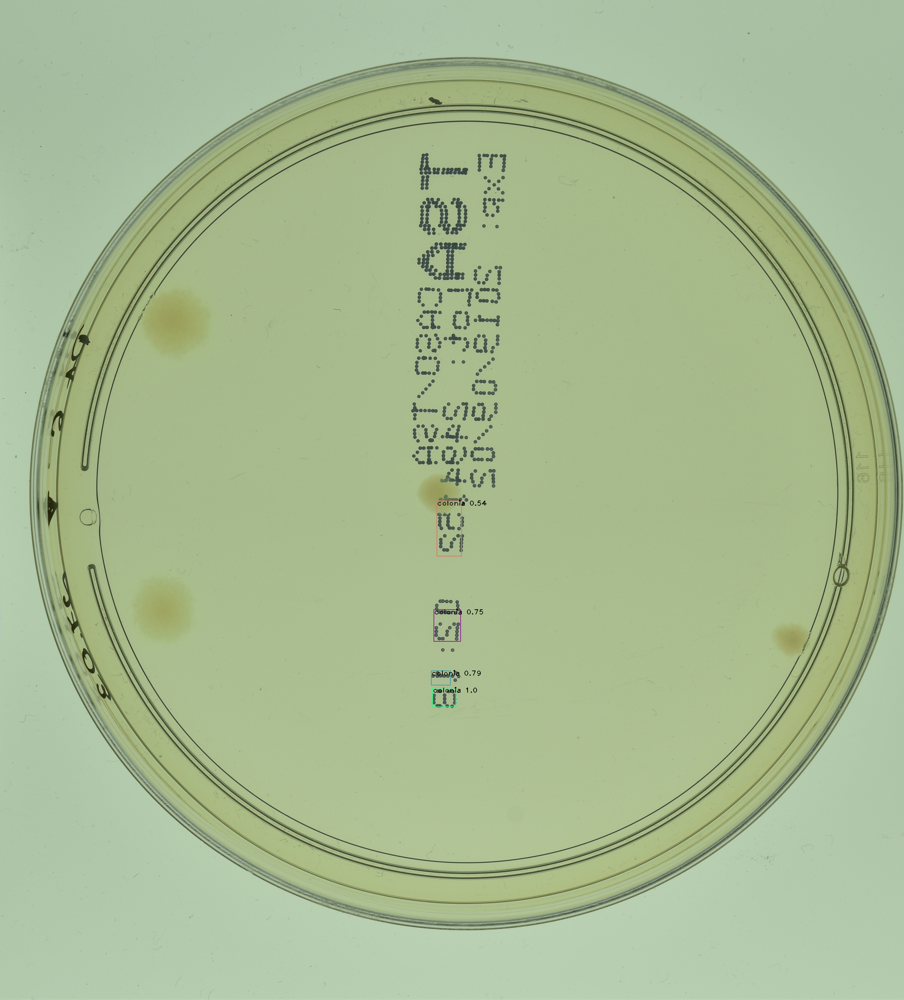

In [ ]:
classes=['colonia'] #Deve ser uma lista das classes presentes, no meu caso, apenas uma
my_img= cv2.imread('14627.jpg')
ht,wt,_=my_img.shape
blob=cv2.dnn.blobFromImage(my_img,1/255,(416,416),(0,0,0),swapRB=True,crop=False)
net.setInput(blob)
last_layer= net.getUnconnectedOutLayersNames()
layer_out= net.forward(last_layer)
boxes=[]
confidences=[]
class_ids=[]
for output in layer_out:
  for detection in output:
    score= detection[5:]
    class_id= np.argmax(score)
    confidence= score[class_id]
    if confidence > .5:
      center_x = int(detection[0]*wt)
      center_y = int(detection[1]*ht)
      w= int(detection[2]*wt)
      h= int(detection[3]*ht)

      x= int(center_x - w/2)
      y= int(center_y - h/2)
      boxes.append([x,y,w,h])
      confidences.append((float(confidence)))
      class_ids.append(class_id)
indexes= cv2.dnn.NMSBoxes(boxes,confidences,.5,.4)
font= cv2.FONT_HERSHEY_PLAIN
colors=np.random.uniform(0,255,size=(len(boxes),3))
for i in indexes.flatten():
  x,y,w,h= boxes[i]
  label= str(classes[class_ids[i]])
  confidence= str(round(confidences[i],2))
  color=colors[i]
  cv2.rectangle(my_img,(x,y),(x+w,y+h),color,2)
  cv2.putText(my_img,label+ ' '+confidence,(x,y+20),font,2,(0,0,0),2)
from google.colab.patches import cv2_imshow
cv2_imshow(my_img)

/content/drive/My Drive/yolo_custom_model_Training


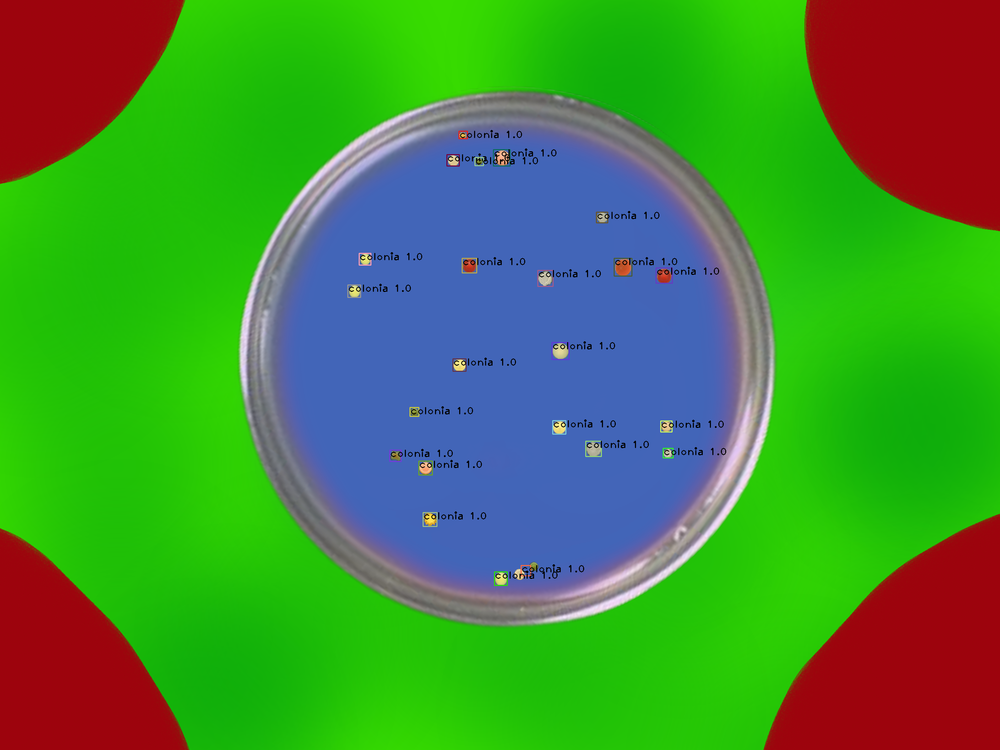

In [ ]:
%cd /content/drive/My Drive/yolo_custom_model_Training
net= cv2.dnn.readNetFromDarknet('backup/yolov3_custom.cfg','backup/yolov3_custom_final.weights')
classes=['colonia'] #Deve ser uma lista das classes presentes, no meu caso, apenas uma
my_img= cv2.imread('colonia_check/24.png')
ht,wt,_=my_img.shape
blob=cv2.dnn.blobFromImage(my_img,1/255,(416,416),(0,0,0),swapRB=True,crop=False)
net.setInput(blob)
last_layer= net.getUnconnectedOutLayersNames()
layer_out= net.forward(last_layer)
boxes=[]
confidences=[]
class_ids=[]
for output in layer_out:
  for detection in output:
    score= detection[5:]
    class_id= np.argmax(score)
    confidence= score[class_id]
    if confidence > .2:
      center_x = int(detection[0]*wt)
      center_y = int(detection[1]*ht)
      w= int(detection[2]*wt)
      h= int(detection[3]*ht)

      x= int(center_x - w/2)
      y= int(center_y - h/2)
      boxes.append([x,y,w,h])
      confidences.append((float(confidence)))
      class_ids.append(class_id)
indexes= cv2.dnn.NMSBoxes(boxes,confidences,.5,.4)
font= cv2.FONT_HERSHEY_PLAIN
colors=np.random.uniform(0,255,size=(len(boxes),3))
for i in indexes.flatten():
  x,y,w,h= boxes[i]
  label= str(classes[class_ids[i]])
  confidence= str(round(confidences[i],2))
  color=colors[i]
  cv2.rectangle(my_img,(x,y),(x+w,y+h),color,2)
  cv2.putText(my_img,label+ ' '+confidence,(x,y+20),font,2,(0,0,0),2)
from google.colab.patches import cv2_imshow
cv2_imshow(my_img)

### Uso em vídeos

In [ ]:
cap= cv2.VideoCapture('video3.mp4')
fourcc= cv2.VideoWriter_fourcc(*'XVID')
quadros = 29.0 #frames por segundo
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
out= cv2.VideoWriter('resultado6.mp4',fourcc,quadros,(frame_width,frame_height))

while(cap.isOpened()):
  ret, frame = cap.read()
  if ret == True:
    #Todo o tratamento que era em uma imagem, acontece aqui até...
    my_img= frame
    ht,wt,_=my_img.shape
    blob=cv2.dnn.blobFromImage(my_img,1/255,(416,416),(0,0,0),swapRB=True,crop=False)
    net.setInput(blob)
    last_layer= net.getUnconnectedOutLayersNames()
    layer_out= net.forward(last_layer)
    boxes=[]
    confidences=[]
    class_ids=[]
    for output in layer_out:
      for detection in output:
        score= detection[5:]
        class_id= np.argmax(score)
        confidence= score[class_id]
        if confidence > .6:
          center_x = int(detection[0]*wt)
          center_y = int(detection[1]*ht)
          w= int(detection[2]*wt)
          h= int(detection[3]*ht)

          x= int(center_x - w/2)
          y= int(center_y - h/2)
          boxes.append([x,y,w,h])
          confidences.append((float(confidence)))
          class_ids.append(class_id)
    indexes= cv2.dnn.NMSBoxes(boxes,confidences,.5,.4)
    #font= cv2.FONT_HERSHEY_PLAIN
    #colors=np.random.uniform(0,255,size=(len(boxes),3))
    colors= np.array([33.,163.,13.])
    if indexes is not ():
      for i in indexes.flatten():
        x,y,w,h= boxes[i]
        #label= str(classes[class_ids[i]])
        #confidence= str(round(confidences[i],2))
        color=colors#[i]
        cv2.rectangle(my_img,(x,y),(x+w,y+h),color,2)
        #cv2.putText(my_img,label+ ' '+confidence,(x,y+20),font,2,(0,0,0),2)
    #Ele vai até aqui -----------
    out.write(my_img)
  else:
    break
cap.release()
out.release()